## Prática: Optical Caracter Recognition

Nesta prática será feita uma investigação sobre a base de dados, bem como identificação de ruídos. Na sequência será feita seleção de atributos e transformações sobre eles.
[Maiores detalhes sobre a prática](https://docs.google.com/document/d/19hujByNpyvDqJYW2QCeU-ecJK4uSLTslBXaouM9N05c/edit?usp=sharing)

## Antes de começar...

**Dependencias:** instalar Weka.

## Parte 1 - Explorando os dados

Sua primeira tarefa é aprender sobre a coleção e verificar ruídos nas mesmas

**Atividade 1**: Observe os histogramas (distribuições de classe por atributos). No pandas, existe o método describe e, no Weka, os histogramas estão na aba de preprocessamento e os gráficos  de espalhamento na aba “Visualize” (não esqueça de aplicar o jitter). Olhe também as instâncias usando o botão edit e tente visualiza-la por meio de um heatmap1. Como o dígito está sendo representado nesta imagem (ou seja, qual cor é o fundo e qual a é a cor do dígito)? Você percebe algo de incomum em alguma instância? Existe alguma instância com atributos que podem representar ruídos? Descreva qualquer características que lhe chame a atenção (dica: pense que valores você esperaria nos pixels de diferentes áreas da imagem).


In [1]:
import pandas as pd
all_data = pd.read_csv('mnist_avaliacao.csv', sep=',')
test_data = pd.read_csv('mnist_teste.csv', sep=',')

In [2]:
# overview types
all_data.dtypes.value_counts()

int64    785
dtype: int64

In [3]:
# take a look at the last columns 
all_data.dtypes.tail()

pixel_28_25    int64
pixel_28_26    int64
pixel_28_27    int64
pixel_28_28    int64
y_class        int64
dtype: object

In [4]:
# lets take a look at the 'class' balance. I had to rename to 'y_class', because class is already in use in python 
all_data.y_class

0       8
1       7
2       5
3       6
4       5
       ..
2044    4
2045    1
2046    6
2047    8
2048    8
Name: y_class, Length: 2049, dtype: int64

In [5]:
# take a look at the minimum value avaible
all_data.iloc[:, :-1].min().value_counts()

0    784
dtype: int64

In [6]:
# take a look at the maximum value avaible
all_data.iloc[:, :-1].max().value_counts()

255    467
254    207
253     70
252     23
251     12
250      4
247      1
dtype: int64

In [7]:
# lets overview values
all_data.describe()

,pixel_1_1,pixel_1_2,pixel_1_3,pixel_1_4,pixel_1_5,pixel_1_6,pixel_1_7,pixel_1_8,pixel_1_9,pixel_1_10,...,pixel_28_20,pixel_28_21,pixel_28_22,pixel_28_23,pixel_28_24,pixel_28_25,pixel_28_26,pixel_28_27,pixel_28_28,y_class
count,2049.000000,2049.000000,2049.000000,2049.000000,2049.000000,2049.000000,2049.000000,2049.000000,2049.000000,2049.000000,...,2049.000000,2049.000000,2049.000000,2049.000000,2049.000000,2049.000000,2049.000000,2049.000000,2049.000000,2049.000000
mean,5.418253,5.599317,5.452416,5.510005,5.542704,5.527086,5.403612,5.579307,5.550512,5.513421,...,5.937531,5.731576,5.618838,5.571498,5.485603,5.507565,5.508053,5.584675,5.573450,4.573450
std,34.360711,35.502751,34.561946,34.924724,35.135678,35.024662,34.264219,35.374181,35.190643,34.964895,...,36.003499,35.599994,35.547952,35.319550,34.772333,34.904754,34.938311,35.386521,35.324978,2.907022
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.000000
max,251.000000,253.000000,253.000000,254.000000,254.000000,252.000000,252.000000,254.000000,253.000000,254.000000,...,253.000000,254.000000,254.000000,254.000000,252.000000,253.000000,254.000000,253.000000,254.000000,9.000000


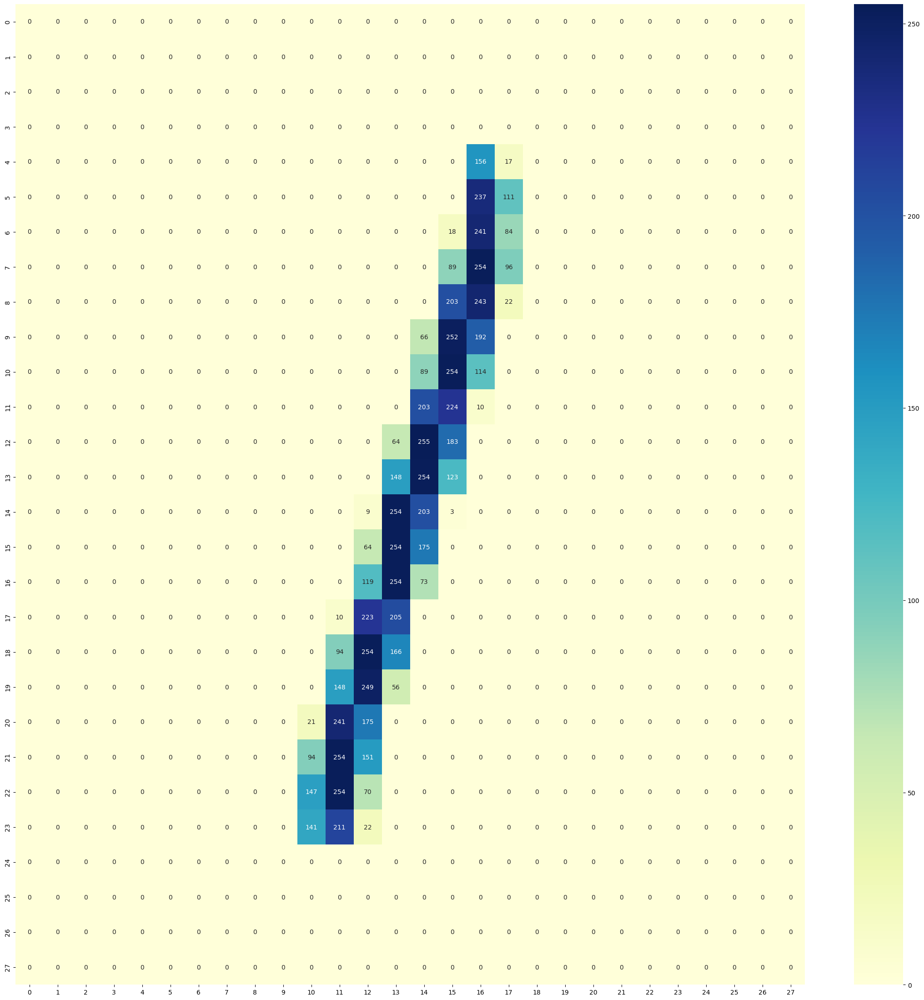

In [8]:
# lets recover 1 line and try to draw

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# choose a number between 1 and 2050 to draw
to_show = 5 

# define a matrix and rules
line_breaker = 0
square_reference = 28
matrix_row = 0
matrix = []
matrix.append([])

# pass through all_data
for index, row in all_data.iterrows():
    
    # the choosen one
    if index == to_show:
        
        # recover itens
        for item in row:
            
            # filter the y_class item
            if matrix_row < square_reference:
                
                # build matrix
                matrix[matrix_row].append(item)
                line_breaker += 1
                
                # new line
                if (line_breaker%square_reference == 0):
                    matrix_row += 1
                    
                    # append new line except for the last one
                    if matrix_row < square_reference:
                        matrix.append([])
                        
                    line_breaker = 0
        
        # No need to run iterrows until the end
        break

# heatmap plot of matrix
plt.figure(figsize=(28, 28))
sns.heatmap(matrix, annot=True, fmt="d", cmap="YlGnBu")
plt.show()

*Discussão:*

Como o dígito está sendo representado nesta imagem (ou seja, qual cor é o fundo e qual a é a cor do dígito)? Você percebe algo de incomum em alguma instância? Existe alguma instância com atributos que podem representar ruídos? Descreva qualquer características que lhe chame a atenção (dica: pense que valores você esperaria nos pixels de diferentes áreas da imagem).

*Resposta:*

Ao ver os dados em formato de heatmap, ficou evidente que o valor 0 corresponde a cor do fundo, será convencionado como branco. Enquando isso, os pixels centrais do número escrito à mão apresentam valores mais altos próximos de 255 que representam a cor do dígito, será convencionado com preto. Uma parte das instâncias é problemática pois apresentam valores próximo de 128, meio termo entre os extremos, e podem representar ruídos. Isso acontece com os pixels da borda dos números onde a tinta borrou, mas não completou perfeitamente o contorno.

**Atividade 2**: No Weka, avalie esta coleção “mnist_avaliacao.csv” usando validação cruzada com 5 partições. Utilize os métodos J48 e NaiveBayes. Qual a precisão geral do método? Apresente a matriz de confusão. Quais conclusões você tira a partir da matriz de confusão de cada método? Quais classes são mais fácieis de prever? E a mais difícieis? Quais são os erros mais comuns em cada metodo?


*Nota:* 

Por estar fazendo direto com Python, há a possibilidade de usar outros métodos, portanto, serão usados Random Forest e Decision Tree

In [9]:
# python libraries
import optuna
import pandas as pd
import hiplot as hip 

# python codes
from resultado import Fold
from avaliacao import Experimento
from metodo import ScikitLearnAprendizadoDeMaquina

file_name = 'mnist_avaliacao.csv'

# define classes
numbers_names = ['0','1','2','3','4','5','6','7','8','9']
numbers_values = [x for x in range(0,10,1)]
numbers = dict(zip(numbers_values,numbers_names))

# recover DataFrame
df_data = pd.DataFrame(pd.read_csv(file_name))

#gera o fold e p experimento
folds = Fold.gerar_k_folds(df_data,val_k=5,col_classe='y_class',
                            num_repeticoes=1,seed=1,
                            num_folds_validacao=3,num_repeticoes_validacao=2)

In [10]:
# randomForrestClassifier
from sklearn.ensemble import RandomForestClassifier
from avaliacao import OtimizacaoObjetivoRandomForest

clf_rf = RandomForestClassifier(random_state=1)
ml_method = ScikitLearnAprendizadoDeMaquina(clf_rf)
exp = Experimento(folds,ml_method, OtimizacaoObjetivoRandomForest, num_trials=10,
                    sampler=optuna.samplers.TPESampler(seed=1, n_startup_trials=3))
exp.calcula_resultados()

[I 2023-10-19 16:43:22,244] A new study created in memory with name: no-name-08d227ba-0879-41e1-81fb-eb765d8ece11
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75:

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.wa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.wa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
[I 2023-10-19 16:43:25,159] Trial 5 finished with value: 0.3217141980691954 and parameters: {'min_samples_split': 0.38867844457851414, 'max_features': 0.4966951841619159, 'num_arvores': 5}. Best is trial 3 with value: 0.7443483460558658.
C:\Users\user\Documents\GitHub\machine-lea

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.wa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.wa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.wa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.wa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 6 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
[I 2023-10-19 16:43:37,289] Trial 5 finished with value: 0.4673039806499337 and parameters: {'min_samples_split': 0.18247401183522977, 'max_features': 0.27075563906914024, 'num_arvores': 5}. Best is trial 3 with value: 0.7134309304044767.
C:\Users\user\Documents\GitHub\machine-le

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 1 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.wa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 6 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
[I 2023-10-19 16:43:45,742] Trial 6 finished with value: 0.42205126757098693 and parameters: {'min_samples_split': 0.21638958793886506, 'max_features': 0.16497451972058166, 'num_arvores': 5}. Best is trial 5 with value: 0.5770911854992747.
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Docu

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.wa

In [11]:
studdy_fold_0 = exp.studies_per_fold[0]
studdy_fold_0.trials_dataframe().sort_values("value",ascending=False)

,number,value,datetime_start,datetime_complete,duration,params_max_features,params_min_samples_split,params_num_arvores,state
3,3,0.744348,2023-10-19 16:43:23.286954,2023-10-19 16:43:24.222989,0 days 00:00:00.936035,0.163638,0.006228,5,COMPLETE
6,6,0.738639,2023-10-19 16:43:25.160947,2023-10-19 16:43:26.003970,0 days 00:00:00.843023,0.219455,0.014733,4,COMPLETE
4,4,0.644269,2023-10-19 16:43:24.223955,2023-10-19 16:43:24.566975,0 days 00:00:00.343020,0.008135,0.019708,5,COMPLETE
2,2,0.516017,2023-10-19 16:43:22.838952,2023-10-19 16:43:23.284951,0 days 00:00:00.445999,0.172780,0.093130,2,COMPLETE
9,9,0.363101,2023-10-19 16:43:26.818952,2023-10-19 16:43:27.221985,0 days 00:00:00.403033,0.163679,0.235499,3,COMPLETE
5,5,0.321714,2023-10-19 16:43:24.567973,2023-10-19 16:43:25.158949,0 days 00:00:00.590976,0.496695,0.388678,5,COMPLETE
1,1,0.298297,2023-10-19 16:43:22.568955,2023-10-19 16:43:22.836952,0 days 00:00:00.267997,0.073378,0.151166,1,COMPLETE
7,7,0.260307,2023-10-19 16:43:26.004950,2023-10-19 16:43:26.365946,0 days 00:00:00.360996,0.111096,0.315703,3,COMPLETE
8,8,0.233918,2023-10-19 16:43:26.366949,2023-10-19 16:43:26.816950,0 days 00:00:00.450001,0.302326,0.481135,4,COMPLETE
0,0,0.228586,2023-10-19 16:43:22.250954,2023-10-19 16:43:22.567973,0 days 00:00:00.317019,0.360162,0.208511,1,COMPLETE


In [12]:
#gera grafico da variacao de parametros (apenas fold 0)
trials_fold_0 = exp.studies_per_fold[0].trials
data = [{**trial.params, 'loss': trial.value} for trial in trials_fold_0]
hip.Experiment.from_iterable(data).display(force_full_width=True)

<IPython.core.display.Javascript object>

In [13]:
print("Random Forest 28x28")
for resultado in exp.resultados:
    print("Macro f1: " + str(resultado.macro_f1))
    print("\nAcuracia: " + str(resultado.acuracia))
    print("\nf1 por classe: ")
    for key in resultado.f1_por_classe.keys():
        print('\t{} -> {}'.format(numbers[key], resultado.f1_por_classe[key]))
    print("\nprecisao: ")
    for key in resultado.precisao.keys():
        print('\t{} -> {}'.format(numbers[key], resultado.precisao[key]))
    print("\nrevocacao: ")
    for key in resultado.revocacao.keys():
        print('\t{} -> {}'.format(numbers[key], resultado.revocacao[key]))
    print('\nMatriz de confusao: ')
    print("\t", end='')
    for names in numbers.values():
        print(names[:2]+"\t", end='')
    print()
    for i in resultado.mat_confusao:
        print(numbers[i][0:2]+"\t", end='')
        for j in resultado.mat_confusao[i]:
            print(str(resultado.mat_confusao[i][j])+"\t", end='')
        print()
    print('\n')
    print('===================================================================\n')

Random Forest 28x28
Macro f1: 0.7514689672466619

Acuracia: 0.7530562347188264

f1 por classe: 
	0 -> 0.9230769230769231
	1 -> 0.8863636363636364
	2 -> 0.6538461538461539
	3 -> 0.6666666666666667
	4 -> 0.7941176470588236
	5 -> 0.6031746031746031
	6 -> 0.7906976744186046
	7 -> 0.8131868131868133
	8 -> 0.674698795180723
	9 -> 0.7088607594936709

precisao: 
	0 -> 0.9
	1 -> 0.8297872340425532
	2 -> 0.6938775510204082
	3 -> 0.65
	4 -> 0.7714285714285715
	5 -> 0.59375
	6 -> 0.7727272727272727
	7 -> 0.8409090909090909
	8 -> 0.7
	9 -> 0.7368421052631579

revocacao: 
	0 -> 0.9473684210526315
	1 -> 0.9512195121951219
	2 -> 0.6181818181818182
	3 -> 0.6842105263157895
	4 -> 0.8181818181818182
	5 -> 0.6129032258064516
	6 -> 0.8095238095238095
	7 -> 0.7872340425531915
	8 -> 0.6511627906976745
	9 -> 0.6829268292682927

Matriz de confusao: 
	0	1	2	3	4	5	6	7	8	9	
0	36	0	0	0	0	1	1	0	0	0	
1	0	39	0	0	0	0	2	0	0	0	
2	2	1	34	2	0	2	2	3	7	2	
3	0	1	1	26	0	6	1	0	2	1	
4	0	0	0	0	27	0	1	2	1	2	
5	1	1	3	3	2	19	0	1	0	

In [14]:
# decisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier
from avaliacao import OtimizacaoObjetivoArvoreDecisao

clf_dtree = DecisionTreeClassifier(random_state=1)
ml_method = ScikitLearnAprendizadoDeMaquina(clf_dtree)
exp = Experimento(folds,ml_method, OtimizacaoObjetivoArvoreDecisao, num_trials=10,
                    sampler=optuna.samplers.TPESampler(seed=1, n_startup_trials=3))
exp.calcula_resultados()

[I 2023-10-19 16:43:46,926] A new study created in memory with name: no-name-782f07a3-761d-454a-9e00-9f73dfddc3c9
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 6 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 6 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 6 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 9 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

[I 2023-10-19 16:44:02,900] Trial 9 finished with value: 0.6425255657331091 and parameters: {'min_samples_split': 0.005904932428396834}. Best is trial 9 with value: 0.6425255657331091.
[I 2023-10-19 16:44:03,227] A new study created in memory with name: no-name-88f4054c-c7f1-4d62-b153-16a2a290954e
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
[I 2023-10-19 16:44:04,006] Trial 0 finished with value: 0.5712162456933972 and parameters: {'min_samples_split': 0.09313010568883545}. Best is trial 0 with value: 0.5712162456933972.
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureW

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
[I 2023-10-19 16:44:05,224] Trial 2 finished with value: 0.40502916214628537 and parameters: {'min_samples_split': 0.19838373711533497}. Best is trial 0 with value: 0.5712162456933972.
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caract

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há element

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 1 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 1 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há element

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
[I 2023-10-19 16:44:24,367] Trial 3 finished with value: 0.6337916274368436 and parameters: {'min_samples_split': 0.004400763483630303}. Best is trial 3 with value: 0.6337916274368436.
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-alg

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
[I 2023-10-19 16:44:26,155] Trial 5 finished with value: 0.6341627635545164 and parameters: {'min_samples_split': 0.005516917673828947}. Best is trial 5 with value: 0.6341627635545164.
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-alg

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há element

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há element

In [15]:
studdy_fold_0 = exp.studies_per_fold[0]
studdy_fold_0.trials_dataframe().sort_values("value",ascending=False)

,number,value,datetime_start,datetime_complete,duration,params_min_samples_split,state
2,2,0.645754,2023-10-19 16:43:48.108993,2023-10-19 16:43:49.329989,0 days 00:00:01.220996,0.000057,COMPLETE
3,3,0.644180,2023-10-19 16:43:49.331991,2023-10-19 16:43:50.390996,0 days 00:00:01.059005,0.005470,COMPLETE
4,4,0.613736,2023-10-19 16:43:50.392017,2023-10-19 16:43:51.292992,0 days 00:00:00.900975,0.041847,COMPLETE
7,7,0.556913,2023-10-19 16:43:52.397996,2023-10-19 16:43:53.130014,0 days 00:00:00.732018,0.102073,COMPLETE
8,8,0.531054,2023-10-19 16:43:53.131992,2023-10-19 16:43:53.854997,0 days 00:00:00.723005,0.125095,COMPLETE
6,6,0.467043,2023-10-19 16:43:51.641000,2023-10-19 16:43:52.396990,0 days 00:00:00.755990,0.168926,COMPLETE
0,0,0.336383,2023-10-19 16:43:46.929998,2023-10-19 16:43:47.569992,0 days 00:00:00.639994,0.208511,COMPLETE
9,9,0.304493,2023-10-19 16:43:53.855998,2023-10-19 16:43:54.481989,0 days 00:00:00.625991,0.268568,COMPLETE
1,1,0.189742,2023-10-19 16:43:47.571001,2023-10-19 16:43:48.106991,0 days 00:00:00.535990,0.360162,COMPLETE
5,5,0.108233,2023-10-19 16:43:51.294012,2023-10-19 16:43:51.638988,0 days 00:00:00.344976,0.483598,COMPLETE


In [16]:
#gera grafico da variacao de parametros (apenas fold 0)
trials_fold_0 = exp.studies_per_fold[0].trials
data = [{**trial.params, 'loss': trial.value} for trial in trials_fold_0]
hip.Experiment.from_iterable(data).display(force_full_width=True)

<IPython.core.display.Javascript object>

In [17]:
print("Decision Tree 28x28")
for resultado in exp.resultados:
    print("Macro f1: " + str(resultado.macro_f1))
    print("\nAcuracia: " + str(resultado.acuracia))
    print("\nf1 por classe: ")
    for key in resultado.f1_por_classe.keys():
        print('\t{} -> {}'.format(numbers[key], resultado.f1_por_classe[key]))
    print("\nprecisao: ")
    for key in resultado.precisao.keys():
        print('\t{} -> {}'.format(numbers[key], resultado.precisao[key]))
    print("\nrevocacao: ")
    for key in resultado.revocacao.keys():
        print('\t{} -> {}'.format(numbers[key], resultado.revocacao[key]))
    print('\nMatriz de confusao: ')
    print("\t", end='')
    for names in numbers.values():
        print(names[:2]+"\t", end='')
    print()
    for i in resultado.mat_confusao:
        print(numbers[i][0:2]+"\t", end='')
        for j in resultado.mat_confusao[i]:
            print(str(resultado.mat_confusao[i][j])+"\t", end='')
        print()
    print('\n')
    print('===================================================================\n')

Decision Tree 28x28
Macro f1: 0.6523289246191382

Acuracia: 0.6552567237163814

f1 por classe: 
	0 -> 0.8947368421052632
	1 -> 0.7446808510638298
	2 -> 0.627450980392157
	3 -> 0.5063291139240507
	4 -> 0.625
	5 -> 0.5294117647058824
	6 -> 0.7906976744186046
	7 -> 0.674698795180723
	8 -> 0.611764705882353
	9 -> 0.5185185185185186

precisao: 
	0 -> 0.8947368421052632
	1 -> 0.660377358490566
	2 -> 0.6808510638297872
	3 -> 0.4878048780487805
	4 -> 0.6451612903225806
	5 -> 0.4864864864864865
	6 -> 0.7727272727272727
	7 -> 0.7777777777777778
	8 -> 0.6190476190476191
	9 -> 0.525

revocacao: 
	0 -> 0.8947368421052632
	1 -> 0.8536585365853658
	2 -> 0.5818181818181818
	3 -> 0.5263157894736842
	4 -> 0.6060606060606061
	5 -> 0.5806451612903226
	6 -> 0.8095238095238095
	7 -> 0.5957446808510638
	8 -> 0.6046511627906976
	9 -> 0.5121951219512195

Matriz de confusao: 
	0	1	2	3	4	5	6	7	8	9	
0	34	0	2	0	0	1	0	0	1	0	
1	0	35	2	1	0	0	1	0	2	0	
2	3	3	32	3	2	1	1	3	5	2	
3	0	3	4	20	1	3	3	1	2	1	
4	0	0	1	5	20	1	1	1	

*Resposta:*

Ao olhar para os resultados dos dois métodos é possível dizer que ambos enfrentaram muitas dificuldades de classificar números 2, 3, 4, 5, 7, 8 e 9. Os números parecem se confundir bastante, isso fica claro ao perceber os índices de precisão na escala de 60% e 70%. Fica mais evidente na matriz de decisão. Embora, as classificações tenham acertado na maioria, boa parte dos números se confunde bastante. O número mais fácil de classificar foi o 0, seguido do 1 e do 6.

Comparando os resultados, o método Random Forest obteve melhor resultado geral se comparados com Decision Tree, ao olhar para Macro F1 e acurácia. Embora, ambos modelos ainda erram muito.

## Parte 2 - Seleção e engenharia de atributos

Agora vamos melhorar o modelo explorando os atributos.

**Atividade 1**: No Weka, em Select Atributes, calcule o infogain (Ganho de Informação) de cada atributo. Vá a aba de visualização e observe os gráficos de dispersão entre os atributos mais bem e pior ranqueados contra a classe. Também analise os  histogramas na aba preprocessamento. Que diferença você nota? Qual região que possui os pixels mais importantes? (Dica: Tente também plotar os valores de  infogain de uma forma que fique fácil de identificar a região que cada pixel representa use um heatmap2).


In [18]:
from ganho_informacao import ganho_informacao

# Leia o CSV e armazene-o em um DataFrame - use a função read_csv do pandas
columns = []

# ajustar o nome
database = all_data

info_gain_database = pd.DataFrame(columns=['Atributo', 'Ganho de Informação'])
for column in database.columns:
    if column != 'y_class':
        info_gain_database.loc[len(info_gain_database)] = {'Atributo': column, 'Ganho de Informação': ganho_informacao(database, 'y_class', column)}

print(info_gain_database)

        Atributo  Ganho de Informação
0      pixel_1_1             0.061958
1      pixel_1_2             0.066040
2      pixel_1_3             0.067624
3      pixel_1_4             0.067017
4      pixel_1_5             0.067256
..           ...                  ...
779  pixel_28_24             0.069208
780  pixel_28_25             0.069576
781  pixel_28_26             0.063720
782  pixel_28_27             0.062566
783  pixel_28_28             0.064328

[784 rows x 2 columns]


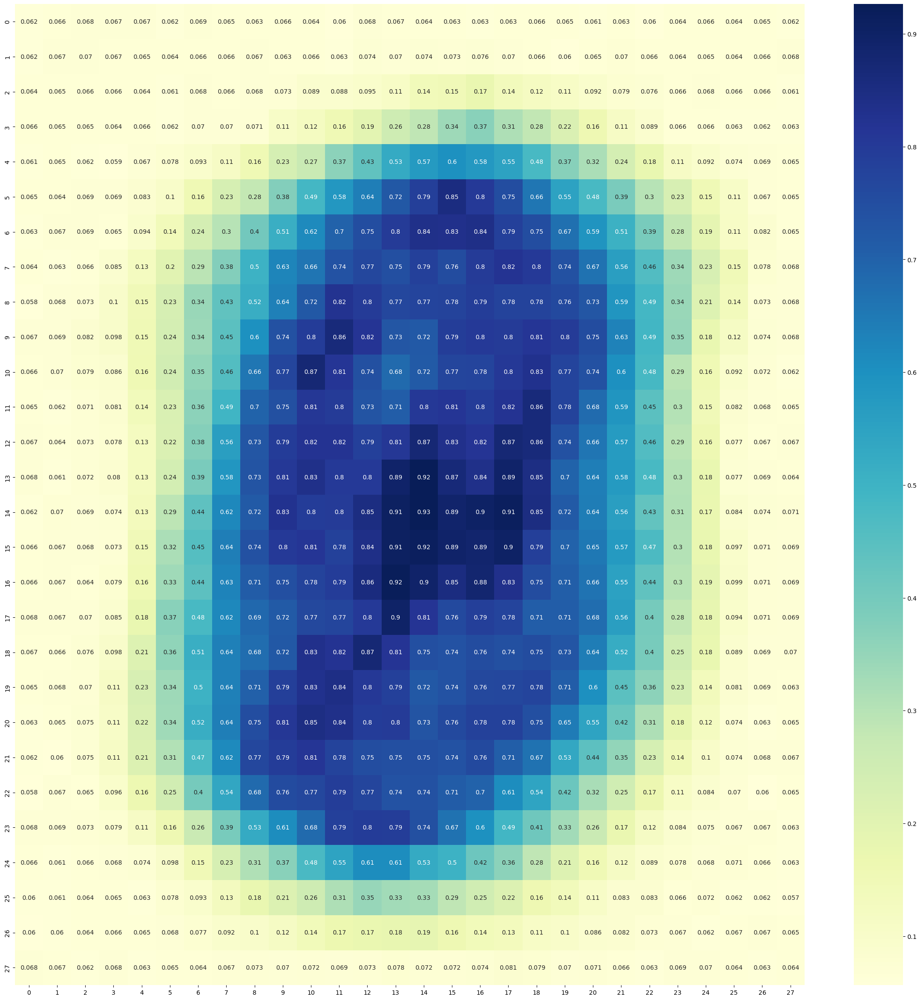

In [19]:
# Defina o tamanho desejado da matriz
square_reference = 28

# Inicialize a matriz
info_gain_matrix_index = 0
info_gain_matrix = []
info_gain_matrix.append([])

# Percorra as linhas do DataFrame e preencha a matriz com os valores da linha desejada
line_breaker = 0
for index, row in info_gain_database.iterrows():
    for item in row:
        if not('pixel' in str(item)):
            if info_gain_matrix_index < square_reference:
                info_gain_matrix[info_gain_matrix_index].append(item)
                line_breaker += 1
                if (line_breaker % square_reference == 0):
                    info_gain_matrix_index += 1
                    if info_gain_matrix_index < square_reference:
                        info_gain_matrix.append([])
                    line_breaker = 0
                    
# Crie um heatmap com seaborn
plt.figure(figsize=(29, 29))
sns.heatmap(info_gain_matrix, annot=True, cmap="YlGnBu")
plt.show()

*Discussão:*

Que diferença você nota? Qual região que possui os pixels mais importantes?

*Resposta:*

A informação obtida pelo info_gain sugere que as primeira 4 linhas, as primeiras 4 colunas, as últimas 4 linhas e as últimas 4 colunas não são tão expressivas na determinação do dígito. Isso acontece porque as amostras coletadas não fizeram bom uso do espaço disponível tornando os pixels dos cantos irrelevantes. Poderia ser feito um corte mais interessante também arredondando as bordas da matriz, mas isso implicaria em uma matriz deformada. Então essa ideia não será considerada. O plano consiste em apenas fazer as eliminações das linhas e colunas sugeridas, ocorre uma redução de 384 atributos. Antes desse filtro, o total era de 784. Com a eliminação, esse número cai para 400. É uma redução aproximada de 49% dos atributos relevantes e ainda mantém a matriz quadrada.

**Atividade 2**: Analise os atributos individuais na aba preprocessamento além do infogain de cada atributo. Identifique os atributos que não são úteis ao processo de classificação. Remova estes atributos descreva e justifique as remoções. Armazene o dataset em “mnist_sample_selecaoFeature.csv”. (dica: Analisando o infogain, você pode selecionar apenas os mais importantes alterando os parametros do “Ranker”: Clique em ranker, mude o threshold para eliminar os valores de infogain que achar pertinente. Logo após, copie a lista de “selected attributes”. Vá na aba de preprocessamento, utilize o filtro não supervisionado de atributos “Remove” com esta lista não esqueça de inverter a seleção e cuidado para não remover a classe.).Armazene o dataset em “mnist_sample_selecaoFeature.csv”. 


In [20]:
# Removendo atributos
# Removendo 4 primeiras linhas
# Removendo 4 últimas linhas
# Removendo 4 primeiras colunas
# Removendo 4 últimas colunas
square_reference = 28
start_rows = 4
start_columns = 4
last_rows = 24
last_columns = 24

# create filter
filtr = np.zeros((28,28))
for i in range(start_rows, last_rows):
    for j in range(start_columns, last_columns):
        filtr[i][j] = 1

filtr_array = []
for i in range(28):
    for j in range(28):
        filtr_array.append(int(filtr[i][j]))
        
filtr_array.append(2)

In [21]:
#handling file and filter csv
new_file = open('mnist_sample_selecaoFeature.csv', 'w')
with open('mnist_avaliacao.csv', 'r') as file:
    first_row = True
    for line in file:
        row_to_write = ''
        items = line.split(',')
        for i in range(len(items)):
            if filtr_array[i] == 1:
                row_to_write += items[i]+','
            elif filtr_array[i] == 2:
                row_to_write += items[i]
        nan = False
        if not first_row:
            for item in row_to_write:
                if not item.isnumeric() and not item.isalpha() and item!=',' and item!='\n':
                    nan = True
        if row_to_write.count(',') == 400 and not nan:
            new_file.write(row_to_write)
        first_row = False
new_file.close()

In [22]:
database = pd.read_csv('mnist_sample_selecaoFeature.csv', sep=',')

# Leia o CSV e armazene-o em um DataFrame - use a função read_csv do pandas
columns = []

info_gain_database = pd.DataFrame(columns=['Atributo', 'Ganho de Informação'])
for column in database.columns:
    if column != 'y_class':
        info_gain_database.loc[len(info_gain_database)] = {'Atributo': column, 'Ganho de Informação': ganho_informacao(database, 'y_class', column)}

print(info_gain_database)

        Atributo  Ganho de Informação
0      pixel_5_5             0.066839
1      pixel_5_6             0.078354
2      pixel_5_7             0.093067
3      pixel_5_8             0.113408
4      pixel_5_9             0.155213
..           ...                  ...
395  pixel_24_20             0.330951
396  pixel_24_21             0.264888
397  pixel_24_22             0.172467
398  pixel_24_23             0.115130
399  pixel_24_24             0.084437

[400 rows x 2 columns]


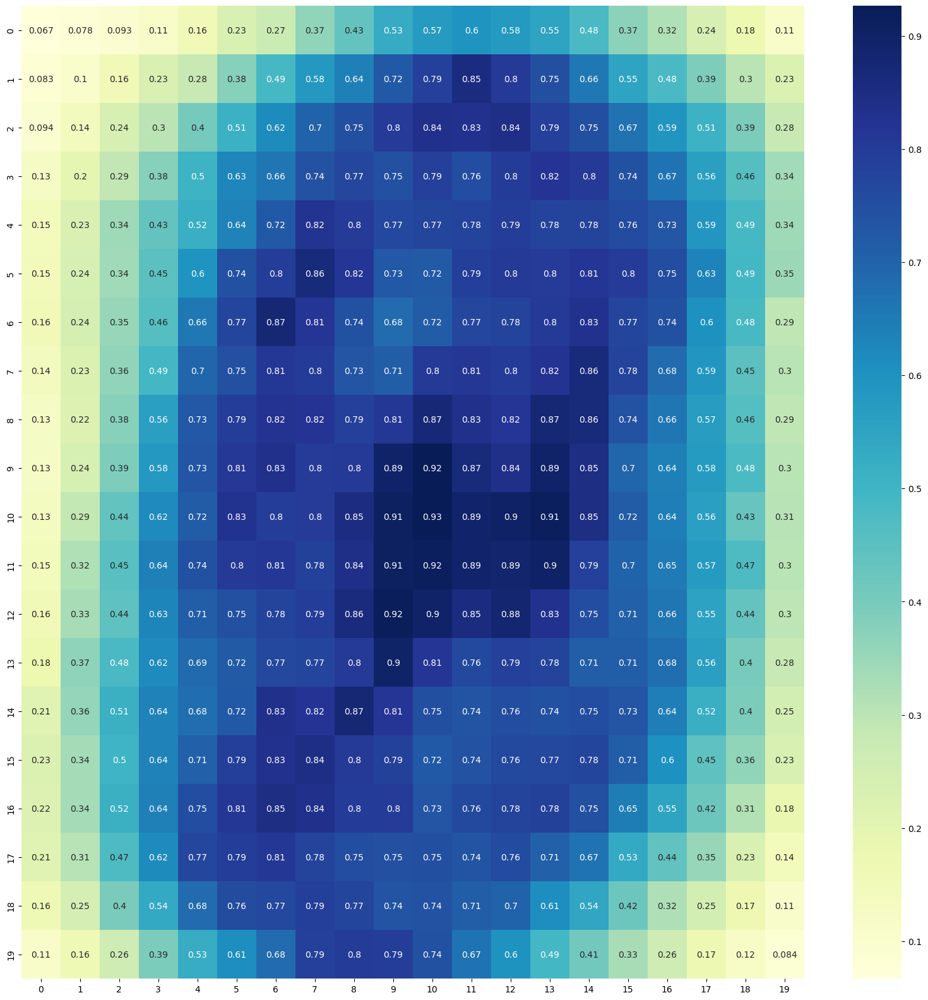

In [23]:
# Defina o tamanho desejado da matriz
square_reference = 20

# Inicialize a matriz
info_gain_matrix_index = 0
info_gain_matrix = []
info_gain_matrix.append([])

# Percorra as linhas do DataFrame e preencha a matriz com os valores da linha desejada
line_breaker = 0
for index, row in info_gain_database.iterrows():
    for item in row:
        if not('pixel' in str(item)):
            if info_gain_matrix_index < square_reference:
                info_gain_matrix[info_gain_matrix_index].append(item)
                line_breaker += 1
                if (line_breaker % square_reference == 0):
                    info_gain_matrix_index += 1
                    if info_gain_matrix_index < square_reference:
                        info_gain_matrix.append([])
                    line_breaker = 0
                    
# Crie um heatmap com seaborn
plt.figure(figsize=(20, 20))
sns.heatmap(info_gain_matrix, annot=True, cmap="YlGnBu")
plt.show()

**Atividade 3**: Re-avalie a base usando NB e  J48 no Weka. Compare o resultado com o que você obteve em I(d). Qual foi o benefício de realizar esta remoções?


In [24]:
# python libraries
import optuna
import pandas as pd
import hiplot as hip 

# python codes
from resultado import Fold
from avaliacao import Experimento
from metodo import ScikitLearnAprendizadoDeMaquina

file_name = 'mnist_sample_selecaoFeature.csv'

# define classes
numbers_names = ['0','1','2','3','4','5','6','7','8','9']
numbers_values = [x for x in range(10)]
numbers = dict(zip(numbers_values,numbers_names))

# recover DataFrame
df_data = pd.DataFrame(pd.read_csv(file_name))

#gera o fold e p experimento
folds = Fold.gerar_k_folds(df_data,val_k=5,col_classe='y_class',
                            num_repeticoes=1,seed=1,
                            num_folds_validacao=3,num_repeticoes_validacao=2)

In [25]:
# randomForrestClassifier
from sklearn.ensemble import RandomForestClassifier
from avaliacao import OtimizacaoObjetivoRandomForest

clf_rf = RandomForestClassifier(random_state=1)
ml_method = ScikitLearnAprendizadoDeMaquina(clf_rf)
exp = Experimento(folds,ml_method, OtimizacaoObjetivoRandomForest, num_trials=10,
                    sampler=optuna.samplers.TPESampler(seed=1, n_startup_trials=3))
exp.calcula_resultados()

[I 2023-10-19 16:47:33,146] A new study created in memory with name: no-name-9a09b951-014a-4c29-bb68-1314cf5ad56b
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75:

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 1 precisão foi definida como zero.
  warnings.wa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.wa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
[I 2023-10-19 16:47:35,824] Trial 6 finished with value: 0.719584856928992 and parameters: {'min_samples_split': 0.014732611175317156, 'max_features': 0.2194546228877615, 'num_arvores': 4}. Best is trial 3 with value: 0.7425754182390967.
C:

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
[I 2023-10-19 16:47:36,039] Trial 7 finished with value: 0.2209203207800161 and parameters: {'min_samples_split': 0.3157031057227023, 'max_features': 0.1110964973927003, 'num_arvores': 3}. Best is trial 3 with value: 0.7425754182390967.
C:\Users\user\Documents\GitHub\machine-lear

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.wa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 8 precisão foi definida como zero.
  warnings.wa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 1 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 6 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
[I 2023-10-19 16:47:49,004] Trial 7 finished with value: 0.6920742608817063 and parameters: {'min_samples_split': 0.00011899915276171805, 'max_features': 0.12866442313067528, 'num_arvores': 4}. Best is trial 0 with value: 0.728150828830464.

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
[I 2023-10-19 16:47:49,583] Trial 9 finished with value: 0.49234257158999273 and parameters: {'min_samples_split': 0.09747989511302624, 'max_features': 0.00040284700639725557, 'num_arvores': 5}. Best is trial 0 with value: 0.728150828830464

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 9 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

In [26]:
studdy_fold_0 = exp.studies_per_fold[0]
studdy_fold_0.trials_dataframe().sort_values("value",ascending=False)

,number,value,datetime_start,datetime_complete,duration,params_max_features,params_min_samples_split,params_num_arvores,state
3,3,0.742575,2023-10-19 16:47:33.728362,2023-10-19 16:47:34.443363,0 days 00:00:00.715001,0.163638,0.006228,5,COMPLETE
6,6,0.719585,2023-10-19 16:47:35.214363,2023-10-19 16:47:35.824387,0 days 00:00:00.610024,0.219455,0.014733,4,COMPLETE
4,4,0.659417,2023-10-19 16:47:34.445364,2023-10-19 16:47:34.781361,0 days 00:00:00.335997,0.008135,0.019708,5,COMPLETE
2,2,0.482528,2023-10-19 16:47:33.495369,2023-10-19 16:47:33.727367,0 days 00:00:00.231998,0.172780,0.093130,2,COMPLETE
9,9,0.339053,2023-10-19 16:47:36.398363,2023-10-19 16:47:36.650360,0 days 00:00:00.251997,0.163679,0.235499,3,COMPLETE
5,5,0.270559,2023-10-19 16:47:34.783365,2023-10-19 16:47:35.212366,0 days 00:00:00.429001,0.496695,0.388678,5,COMPLETE
1,1,0.251799,2023-10-19 16:47:33.345362,2023-10-19 16:47:33.494366,0 days 00:00:00.149004,0.073378,0.151166,1,COMPLETE
7,7,0.220920,2023-10-19 16:47:35.825368,2023-10-19 16:47:36.039371,0 days 00:00:00.214003,0.111096,0.315703,3,COMPLETE
0,0,0.201741,2023-10-19 16:47:33.147363,2023-10-19 16:47:33.343361,0 days 00:00:00.195998,0.360162,0.208511,1,COMPLETE
8,8,0.192687,2023-10-19 16:47:36.041368,2023-10-19 16:47:36.397365,0 days 00:00:00.355997,0.302326,0.481135,4,COMPLETE


In [27]:
#gera grafico da variacao de parametros (apenas fold 0)
trials_fold_0 = exp.studies_per_fold[0].trials
data = [{**trial.params, 'loss': trial.value} for trial in trials_fold_0]
hip.Experiment.from_iterable(data).display(force_full_width=True)

<IPython.core.display.Javascript object>

In [28]:
print("Random Forest 20x20")
for resultado in exp.resultados:
    print("Macro f1: " + str(resultado.macro_f1))
    print("\nAcuracia: " + str(resultado.acuracia))
    print("\nf1 por classe: ")
    for key in resultado.f1_por_classe.keys():
        print('\t{} -> {}'.format(numbers[key], resultado.f1_por_classe[key]))
    print("\nprecisao: ")
    for key in resultado.precisao.keys():
        print('\t{} -> {}'.format(numbers[key], resultado.precisao[key]))
    print("\nrevocacao: ")
    for key in resultado.revocacao.keys():
        print('\t{} -> {}'.format(numbers[key], resultado.revocacao[key]))
    print('\nMatriz de confusao: ')
    print("\t", end='')
    for names in numbers.values():
        print(names[:2]+"\t", end='')
    print()
    for i in resultado.mat_confusao:
        print(numbers[i][0:2]+"\t", end='')
        for j in resultado.mat_confusao[i]:
            print(str(resultado.mat_confusao[i][j])+"\t", end='')
        print()
    print('\n')
    print('===================================================================\n')

Random Forest 20x20
Macro f1: 0.7633773452506818

Acuracia: 0.7652811735941321

f1 por classe: 
	0 -> 0.9599999999999999
	1 -> 0.8636363636363636
	2 -> 0.7961165048543689
	3 -> 0.5813953488372092
	4 -> 0.8115942028985507
	5 -> 0.6557377049180327
	6 -> 0.8505747126436781
	7 -> 0.7727272727272727
	8 -> 0.6753246753246753
	9 -> 0.6666666666666667

precisao: 
	0 -> 0.972972972972973
	1 -> 0.8085106382978723
	2 -> 0.8541666666666666
	3 -> 0.5208333333333334
	4 -> 0.7777777777777778
	5 -> 0.6666666666666666
	6 -> 0.8222222222222222
	7 -> 0.8292682926829268
	8 -> 0.7647058823529411
	9 -> 0.6511627906976745

revocacao: 
	0 -> 0.9473684210526315
	1 -> 0.926829268292683
	2 -> 0.7454545454545455
	3 -> 0.6578947368421053
	4 -> 0.8484848484848485
	5 -> 0.6451612903225806
	6 -> 0.8809523809523809
	7 -> 0.723404255319149
	8 -> 0.6046511627906976
	9 -> 0.6829268292682927

Matriz de confusao: 
	0	1	2	3	4	5	6	7	8	9	
0	36	0	0	0	0	0	1	0	0	1	
1	0	38	0	1	0	0	1	0	1	0	
2	0	2	41	2	0	1	2	2	3	2	
3	0	0	2	25	2	4	3

In [29]:
# decisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier
from avaliacao import OtimizacaoObjetivoArvoreDecisao

clf_dtree = DecisionTreeClassifier(random_state=1)
ml_method = ScikitLearnAprendizadoDeMaquina(clf_dtree)
exp = Experimento(folds,ml_method, OtimizacaoObjetivoArvoreDecisao, num_trials=10,
                    sampler=optuna.samplers.TPESampler(seed=1, n_startup_trials=3))
exp.calcula_resultados()

[I 2023-10-19 16:47:52,817] A new study created in memory with name: no-name-f6325195-dafc-46c7-8984-a0f4fc5c1877
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
[I 2023-10-19 16:47:58,557] Trial 7 finished with value: 0.5542180691156905 and parameters: {'min_samples_split': 0.10207284892725649}. Best is trial 2 with value: 0.6477316108251632.
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-c

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 1 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 6 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 6 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 9 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 8 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

[I 2023-10-19 16:48:10,252] Trial 3 finished with value: 0.6098230345456866 and parameters: {'min_samples_split': 0.04267214009278403}. Best is trial 3 with value: 0.6098230345456866.
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
[I 2023-10-19 16:48:11,514] Trial 4 finished with value: 0.6531886617952778 and parameters: {'min_samples_split': 0.002690884105847245}. Best is trial 4 with value: 0.6531886617952778.
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

[I 2023-10-19 16:48:14,925] A new study created in memory with name: no-name-28fa5369-c3d2-48e7-a706-e281bab097b7
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há element

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 1 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 1 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
[I 2023-10-19 16:48:20,213] Trial 7 finished with value: 0.5122761711381334 and parameters: {'min_samples_split': 0.13476560370679097}. Best is trial 4 with value: 0.6498220442194157.
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-c

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
[I 2023-10-19 16:48:24,921] Trial 3 finished with value: 0.6348196130745087 and parameters: {'min_samples_split': 0.004400763483630303}. Best is trial 3 with value: 0.6348196130745087.
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-alg

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
[I 2023-10-19 16:48:26,218] Trial 5 finished with value: 0.6271265997098533 and parameters: {'min_samples_split': 0.005516917673828947}. Best is trial 3 with value: 0.6348196130745087.
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-alg

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há element

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há element

In [30]:
studdy_fold_0 = exp.studies_per_fold[0]
studdy_fold_0.trials_dataframe().sort_values("value",ascending=False)

,number,value,datetime_start,datetime_complete,duration,params_min_samples_split,state
2,2,0.647732,2023-10-19 16:47:53.741376,2023-10-19 16:47:54.886362,0 days 00:00:01.144986,0.000057,COMPLETE
3,3,0.646299,2023-10-19 16:47:54.887360,2023-10-19 16:47:55.894363,0 days 00:00:01.007003,0.005470,COMPLETE
4,4,0.613175,2023-10-19 16:47:55.896362,2023-10-19 16:47:56.919401,0 days 00:00:01.023039,0.041847,COMPLETE
7,7,0.554218,2023-10-19 16:47:57.745398,2023-10-19 16:47:58.556395,0 days 00:00:00.810997,0.102073,COMPLETE
8,8,0.527877,2023-10-19 16:47:58.557395,2023-10-19 16:47:59.449401,0 days 00:00:00.892006,0.125095,COMPLETE
6,6,0.472746,2023-10-19 16:47:57.241395,2023-10-19 16:47:57.743395,0 days 00:00:00.502000,0.168926,COMPLETE
0,0,0.336383,2023-10-19 16:47:52.822368,2023-10-19 16:47:53.353365,0 days 00:00:00.530997,0.208511,COMPLETE
9,9,0.304493,2023-10-19 16:47:59.452399,2023-10-19 16:48:00.051393,0 days 00:00:00.598994,0.268568,COMPLETE
1,1,0.189742,2023-10-19 16:47:53.356369,2023-10-19 16:47:53.739364,0 days 00:00:00.382995,0.360162,COMPLETE
5,5,0.108233,2023-10-19 16:47:56.921395,2023-10-19 16:47:57.239439,0 days 00:00:00.318044,0.483598,COMPLETE


In [31]:
#gera grafico da variacao de parametros (apenas fold 0)
trials_fold_0 = exp.studies_per_fold[0].trials
data = [{**trial.params, 'loss': trial.value} for trial in trials_fold_0]
hip.Experiment.from_iterable(data).display(force_full_width=True)

<IPython.core.display.Javascript object>

In [32]:
print("Decision Tree 20x20")
for resultado in exp.resultados:
    print("Macro f1: " + str(resultado.macro_f1))
    print("\nAcuracia: " + str(resultado.acuracia))
    print("\nf1 por classe: ")
    for key in resultado.f1_por_classe.keys():
        print('\t{} -> {}'.format(numbers[key], resultado.f1_por_classe[key]))
    print("\nprecisao: ")
    for key in resultado.precisao.keys():
        print('\t{} -> {}'.format(numbers[key], resultado.precisao[key]))
    print("\nrevocacao: ")
    for key in resultado.revocacao.keys():
        print('\t{} -> {}'.format(numbers[key], resultado.revocacao[key]))
    print('\nMatriz de confusao: ')
    print("\t", end='')
    for names in numbers.values():
        print(names[:2]+"\t", end='')
    print()
    for i in resultado.mat_confusao:
        print(numbers[i][0:2]+"\t", end='')
        for j in resultado.mat_confusao[i]:
            print(str(resultado.mat_confusao[i][j])+"\t", end='')
        print()
    print('\n')
    print('===================================================================\n')

Decision Tree 20x20
Macro f1: 0.6509548119989106

Acuracia: 0.6552567237163814

f1 por classe: 
	0 -> 0.8717948717948718
	1 -> 0.8235294117647058
	2 -> 0.627450980392157
	3 -> 0.5714285714285715
	4 -> 0.6478873239436619
	5 -> 0.46874999999999994
	6 -> 0.7586206896551724
	7 -> 0.6444444444444444
	8 -> 0.6265060240963854
	9 -> 0.4691358024691358

precisao: 
	0 -> 0.85
	1 -> 0.7954545454545454
	2 -> 0.6808510638297872
	3 -> 0.5641025641025641
	4 -> 0.6052631578947368
	5 -> 0.45454545454545453
	6 -> 0.7333333333333333
	7 -> 0.6744186046511628
	8 -> 0.65
	9 -> 0.475

revocacao: 
	0 -> 0.8947368421052632
	1 -> 0.8536585365853658
	2 -> 0.5818181818181818
	3 -> 0.5789473684210527
	4 -> 0.696969696969697
	5 -> 0.4838709677419355
	6 -> 0.7857142857142857
	7 -> 0.6170212765957447
	8 -> 0.6046511627906976
	9 -> 0.4634146341463415

Matriz de confusao: 
	0	1	2	3	4	5	6	7	8	9	
0	34	0	1	0	0	2	0	1	0	0	
1	0	35	3	1	0	0	1	0	1	0	
2	2	3	32	4	0	1	2	4	4	3	
3	1	1	3	22	1	3	3	0	2	2	
4	0	0	2	1	23	1	0	1	2	3	
5	0	0	

*Resposta:*

Ao olhar para resultados, poucas mudanças ocorreram nos resultados. Ambos métodos continuaram com saídas gerais parecidas nos seus indicadores.

## Parte 3 - Transformação de atributos

Usando o dataset “mnist_sample_selecaoFeature.arff”. Mude os atributos de numéricos para booleanos. Então re-avalie utilizando  NB e J48. (Dica: Utilize o filtro de atributos NumericToBinary).

In [33]:
#handling file and transform numbers to 0 or 1
new_file = open('mnist_sample_binario.csv', 'w')
with open('mnist_avaliacao.csv', 'r') as file:
    first_row = True
    for line in file:
        row_to_write = ''
        items = line.split(',')
        for i in range(len(items)):
            if first_row:
                if '\n' in items[i]:
                    row_to_write += items[i]
                else:
                    row_to_write += items[i]+','
            else:
                if '\n' in items[i]:
                    row_to_write += items[i]
                else:
                    if float(items[i]) == 0.0:
                        row_to_write += '0,'
                    else:
                        row_to_write += '1,'
        new_file.write(row_to_write)
        first_row = False
new_file.close()

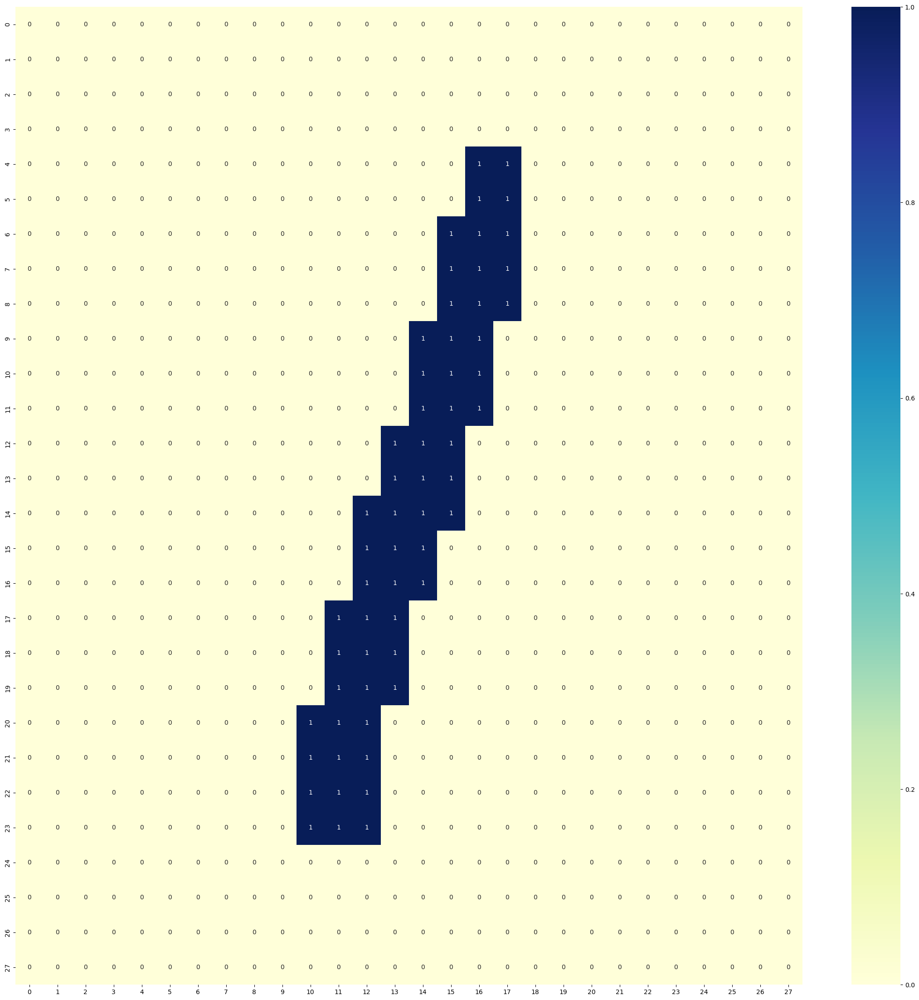

In [34]:
all_data = pd.read_csv('mnist_sample_binario.csv', sep=',')
# choose a number between 1 and 2050 to draw
to_show = 5

# define a matrix and rules
line_breaker = 0
square_reference = 28
matrix_row = 0
matrix = []
matrix.append([])

# pass through all_data
for index, row in all_data.iterrows():
    
    # the choosen one
    if index == to_show:
        
        # recover itens
        for item in row:
            
            # filter the y_class item
            if matrix_row < square_reference:
                
                # build matrix
                matrix[matrix_row].append(item)
                line_breaker += 1
                
                # new line
                if (line_breaker%square_reference == 0):
                    matrix_row += 1
                    
                    # append new line except for the last one
                    if matrix_row < square_reference:
                        matrix.append([])
                        
                    line_breaker = 0
        
        # No need to run iterrows until the end
        break

# heatmap plot of matrix
plt.figure(figsize=(28, 28))
sns.heatmap(matrix, annot=True, fmt="d", cmap="YlGnBu")
plt.show()


*Notas:*

Ao tornar os dados binários, todo número diferente de 0 é tratado como 1. Como apenas o 0 é mantido como 0, o resultado disso está em tratar as bordas que eram mais claras. Talvez essa abordagem não seja muito boa para números como 8 pois podem virar um grande borrão.

**Atividade 1**: Em comparação com o resultado em 2(c), houve ganho no desempenho? Analise e reporte a diferença do desempenho por classe e geral. Com base no que se aprendeu sobre árvore de decisão e a forma que ela é criada para atributos numéricos, justifique o impacto utilizando J48. Armazene o dataset em “mnist_sample_binario.arff”.


In [35]:
# python libraries
import optuna
import pandas as pd
import hiplot as hip 

# python codes
from resultado import Fold
from avaliacao import Experimento
from metodo import ScikitLearnAprendizadoDeMaquina

file_name = 'mnist_sample_binario.csv'

# define classes
numbers_names = ['0','1','2','3','4','5','6','7','8','9']
numbers_values = [x for x in range(10)]
numbers = dict(zip(numbers_values,numbers_names))

# recover DataFrame
df_data = pd.DataFrame(pd.read_csv(file_name))

#gera o fold e p experimento
folds = Fold.gerar_k_folds(df_data,val_k=5,col_classe='y_class',
                            num_repeticoes=1,seed=1,
                            num_folds_validacao=3,num_repeticoes_validacao=2)

In [36]:
# randomForrestClassifier
from sklearn.ensemble import RandomForestClassifier
from avaliacao import OtimizacaoObjetivoRandomForest

clf_rf = RandomForestClassifier(random_state=1)
ml_method = ScikitLearnAprendizadoDeMaquina(clf_rf)
exp = Experimento(folds,ml_method, OtimizacaoObjetivoRandomForest, num_trials=10,
                    sampler=optuna.samplers.TPESampler(seed=1, n_startup_trials=3))
exp.calcula_resultados()

[I 2023-10-19 16:48:37,022] A new study created in memory with name: no-name-f9eeb8fc-789c-44ba-81f5-b7970e38330f
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75:

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.wa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.wa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.wa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.wa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.wa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

[I 2023-10-19 16:48:45,411] A new study created in memory with name: no-name-f2f9e076-8729-4ec2-bf51-bc65766db836
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
[I 2023-10-19 16:48:45,812] Trial 0 finished with value: 0.6459660209981767 and parameters: {'min_samples_split': 0.0701934692

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.wa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

[I 2023-10-19 16:48:52,258] Trial 7 finished with value: 0.7277779182766264 and parameters: {'min_samples_split': 0.00011906965528174886, 'max_features': 0.18095688893544903, 'num_arvores': 4}. Best is trial 3 with value: 0.766884067296234.
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 1 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 9 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
[I 2023-10-19 16:48:54,101] Trial 3 finished with value: 0.2545033296389945 and parameters: {'min_samples_split': 0.4668159691605347, 'max_features': 0.07876874906736847, 'num_arvores': 5}. Best is trial 1 with value: 0.31652376905649304.
C:\Users\user\Documents\GitHub\machine-le

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.wa

In [37]:
studdy_fold_0 = exp.studies_per_fold[0]
studdy_fold_0.trials_dataframe().sort_values("value",ascending=False)

,number,value,datetime_start,datetime_complete,duration,params_max_features,params_min_samples_split,params_num_arvores,state
3,3,0.779143,2023-10-19 16:48:37.860405,2023-10-19 16:48:38.628447,0 days 00:00:00.768042,0.163638,0.006228,5,COMPLETE
6,6,0.755129,2023-10-19 16:48:39.617936,2023-10-19 16:48:40.170949,0 days 00:00:00.553013,0.219455,0.014733,4,COMPLETE
4,4,0.684416,2023-10-19 16:48:38.630447,2023-10-19 16:48:39.095493,0 days 00:00:00.465046,0.008135,0.019708,5,COMPLETE
2,2,0.503766,2023-10-19 16:48:37.596310,2023-10-19 16:48:37.857401,0 days 00:00:00.261091,0.172780,0.093130,2,COMPLETE
9,9,0.323370,2023-10-19 16:48:40.790923,2023-10-19 16:48:41.098928,0 days 00:00:00.308005,0.163679,0.235499,3,COMPLETE
7,7,0.312803,2023-10-19 16:48:40.171949,2023-10-19 16:48:40.466924,0 days 00:00:00.294975,0.111096,0.315703,3,COMPLETE
5,5,0.301928,2023-10-19 16:48:39.096490,2023-10-19 16:48:39.611929,0 days 00:00:00.515439,0.496695,0.388678,5,COMPLETE
1,1,0.267890,2023-10-19 16:48:37.370370,2023-10-19 16:48:37.595310,0 days 00:00:00.224940,0.073378,0.151166,1,COMPLETE
8,8,0.232217,2023-10-19 16:48:40.467951,2023-10-19 16:48:40.788947,0 days 00:00:00.320996,0.302326,0.481135,4,COMPLETE
0,0,0.209156,2023-10-19 16:48:37.023377,2023-10-19 16:48:37.369371,0 days 00:00:00.345994,0.360162,0.208511,1,COMPLETE


In [38]:
#gera grafico da variacao de parametros (apenas fold 0)
trials_fold_0 = exp.studies_per_fold[0].trials
data = [{**trial.params, 'loss': trial.value} for trial in trials_fold_0]
hip.Experiment.from_iterable(data).display(force_full_width=True)

<IPython.core.display.Javascript object>

In [39]:
print("Random Forest 28x28 Binary Form")
for resultado in exp.resultados:
    print("Macro f1: " + str(resultado.macro_f1))
    print("\nAcuracia: " + str(resultado.acuracia))
    print("\nf1 por classe: ")
    for key in resultado.f1_por_classe.keys():
        print('\t{} -> {}'.format(numbers[key], resultado.f1_por_classe[key]))
    print("\nprecisao: ")
    for key in resultado.precisao.keys():
        print('\t{} -> {}'.format(numbers[key], resultado.precisao[key]))
    print("\nrevocacao: ")
    for key in resultado.revocacao.keys():
        print('\t{} -> {}'.format(numbers[key], resultado.revocacao[key]))
    print('\nMatriz de confusao: ')
    print("\t", end='')
    for names in numbers.values():
        print(names[:2]+"\t", end='')
    print()
    for i in resultado.mat_confusao:
        print(numbers[i][0:2]+"\t", end='')
        for j in resultado.mat_confusao[i]:
            print(str(resultado.mat_confusao[i][j])+"\t", end='')
        print()
    print('\n')
    print('===================================================================\n')

Random Forest 28x28 Binary Form
Macro f1: 0.7274842534245659

Acuracia: 0.7310513447432763

f1 por classe: 
	0 -> 0.8780487804878049
	1 -> 0.9069767441860465
	2 -> 0.693877551020408
	3 -> 0.5681818181818182
	4 -> 0.6865671641791046
	5 -> 0.625
	6 -> 0.8095238095238095
	7 -> 0.8
	8 -> 0.6666666666666667
	9 -> 0.64

precisao: 
	0 -> 0.8181818181818182
	1 -> 0.8666666666666667
	2 -> 0.7906976744186046
	3 -> 0.5
	4 -> 0.6764705882352942
	5 -> 0.6060606060606061
	6 -> 0.8095238095238095
	7 -> 0.8372093023255814
	8 -> 0.6829268292682927
	9 -> 0.7058823529411765

revocacao: 
	0 -> 0.9473684210526315
	1 -> 0.9512195121951219
	2 -> 0.6181818181818182
	3 -> 0.6578947368421053
	4 -> 0.696969696969697
	5 -> 0.6451612903225806
	6 -> 0.8095238095238095
	7 -> 0.7659574468085106
	8 -> 0.6511627906976745
	9 -> 0.5853658536585366

Matriz de confusao: 
	0	1	2	3	4	5	6	7	8	9	
0	36	0	0	0	1	1	0	0	0	0	
1	0	39	0	1	0	0	1	0	0	0	
2	3	1	34	6	0	2	2	2	4	1	
3	1	1	2	25	0	2	2	0	4	1	
4	0	0	1	2	23	1	0	2	2	2	
5	1	1	0	5	4	

In [40]:
# decisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier
from avaliacao import OtimizacaoObjetivoArvoreDecisao

clf_dtree = DecisionTreeClassifier(random_state=1)
ml_method = ScikitLearnAprendizadoDeMaquina(clf_dtree)
exp = Experimento(folds,ml_method, OtimizacaoObjetivoArvoreDecisao, num_trials=10,
                    sampler=optuna.samplers.TPESampler(seed=1, n_startup_trials=3))
exp.calcula_resultados()

[I 2023-10-19 16:48:57,814] A new study created in memory with name: no-name-f75ab0aa-610c-463b-9b4a-099e9ae6e9cf
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há element

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
[I 2023-10-19 16:49:01,926] Trial 7 finished with value: 0.5642766332507159 and parameters: {'min_samples_split': 0.10207284892725649}. Best is trial 2 with value: 0.6913657963852463.
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algo

[I 2023-10-19 16:49:02,913] A new study created in memory with name: no-name-92cfcf20-1ab5-4ebc-8a51-236e5dc2a985
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 6 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 1 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 1 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 6 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 9 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
[I 2023-10-19 16:49:09,533] Trial 3 finished with value: 0.6131194443482173 and parameters: {'min_samples_split': 0.04267214009278403}. Best is trial 3 with value: 0.6131194443482173.
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
[I 2023-10-19 16:49:10,083] Trial 4 finished with va

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 6 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 1 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 1 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 1 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 1 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
[I 2023-10-19 16:49:16,091] Trial 8 finished with value: 0.5631447520580425 and parameters: {'min_samples_split': 0.11938573532380353}. Best is trial 4 with value: 0.6904107213340547.
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracte

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
[I 2023-10-19 16:49:19,058] Trial 3 finished with value: 0.642586883404777 and parameters: {'min_samples_split': 0.004400763483630303}. Best is trial 3 with value: 0.642586883404777.
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algor

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
[I 2023-10-19 16:49:19,940] Trial 5 finished with value: 0.6400711912941007 and parameters: {'min_samples_split': 0.005516917673828947}. Best is trial 3 with value: 0.642586883404777.
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algo

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há element

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
[I 2023-10-19 16:49:21,535] Trial 9 finished with value: 0.5214548611016271 and parameters: {'min_samples_split': 0.12082593481518311}. Best is trial 3 with value: 0.642586883404777.


In [41]:
studdy_fold_0 = exp.studies_per_fold[0]
studdy_fold_0.trials_dataframe().sort_values("value",ascending=False)

,number,value,datetime_start,datetime_complete,duration,params_min_samples_split,state
2,2,0.691366,2023-10-19 16:48:58.634349,2023-10-19 16:48:59.288350,0 days 00:00:00.654001,0.000057,COMPLETE
3,3,0.668647,2023-10-19 16:48:59.289350,2023-10-19 16:49:00.052355,0 days 00:00:00.763005,0.005470,COMPLETE
4,4,0.627862,2023-10-19 16:49:00.056353,2023-10-19 16:49:00.590373,0 days 00:00:00.534020,0.041847,COMPLETE
7,7,0.564277,2023-10-19 16:49:01.440347,2023-10-19 16:49:01.926348,0 days 00:00:00.486001,0.102073,COMPLETE
8,8,0.528286,2023-10-19 16:49:01.927349,2023-10-19 16:49:02.379348,0 days 00:00:00.451999,0.125095,COMPLETE
6,6,0.439046,2023-10-19 16:49:00.924354,2023-10-19 16:49:01.439347,0 days 00:00:00.514993,0.168926,COMPLETE
0,0,0.364577,2023-10-19 16:48:57.817361,2023-10-19 16:48:58.302355,0 days 00:00:00.484994,0.208511,COMPLETE
9,9,0.296058,2023-10-19 16:49:02.380354,2023-10-19 16:49:02.776350,0 days 00:00:00.395996,0.268568,COMPLETE
1,1,0.182598,2023-10-19 16:48:58.303351,2023-10-19 16:48:58.633357,0 days 00:00:00.330006,0.360162,COMPLETE
5,5,0.120010,2023-10-19 16:49:00.591355,2023-10-19 16:49:00.923352,0 days 00:00:00.331997,0.483598,COMPLETE


In [42]:
#gera grafico da variacao de parametros (apenas fold 0)
trials_fold_0 = exp.studies_per_fold[0].trials
data = [{**trial.params, 'loss': trial.value} for trial in trials_fold_0]
hip.Experiment.from_iterable(data).display(force_full_width=True)

<IPython.core.display.Javascript object>

In [43]:
print("Decision Tree 28x28 Binary Form")
for resultado in exp.resultados:
    print("Macro f1: " + str(resultado.macro_f1))
    print("\nAcuracia: " + str(resultado.acuracia))
    print("\nf1 por classe: ")
    for key in resultado.f1_por_classe.keys():
        print('\t{} -> {}'.format(numbers[key], resultado.f1_por_classe[key]))
    print("\nprecisao: ")
    for key in resultado.precisao.keys():
        print('\t{} -> {}'.format(numbers[key], resultado.precisao[key]))
    print("\nrevocacao: ")
    for key in resultado.revocacao.keys():
        print('\t{} -> {}'.format(numbers[key], resultado.revocacao[key]))
    print('\nMatriz de confusao: ')
    print("\t", end='')
    for names in numbers.values():
        print(names[:2]+"\t", end='')
    print()
    for i in resultado.mat_confusao:
        print(numbers[i][0:2]+"\t", end='')
        for j in resultado.mat_confusao[i]:
            print(str(resultado.mat_confusao[i][j])+"\t", end='')
        print()
    print('\n')
    print('===================================================================\n')

Decision Tree 28x28 Binary Form
Macro f1: 0.7157493559193919

Acuracia: 0.7188264058679706

f1 por classe: 
	0 -> 0.8888888888888888
	1 -> 0.7070707070707071
	2 -> 0.7142857142857143
	3 -> 0.6835443037974684
	4 -> 0.6567164179104478
	5 -> 0.6333333333333333
	6 -> 0.8
	7 -> 0.7472527472527473
	8 -> 0.6835443037974683
	9 -> 0.6428571428571429

precisao: 
	0 -> 0.8372093023255814
	1 -> 0.603448275862069
	2 -> 0.813953488372093
	3 -> 0.6585365853658537
	4 -> 0.6470588235294118
	5 -> 0.6551724137931034
	6 -> 0.8421052631578947
	7 -> 0.7727272727272727
	8 -> 0.75
	9 -> 0.627906976744186

revocacao: 
	0 -> 0.9473684210526315
	1 -> 0.8536585365853658
	2 -> 0.6363636363636364
	3 -> 0.7105263157894737
	4 -> 0.6666666666666666
	5 -> 0.6129032258064516
	6 -> 0.7619047619047619
	7 -> 0.723404255319149
	8 -> 0.627906976744186
	9 -> 0.6585365853658537

Matriz de confusao: 
	0	1	2	3	4	5	6	7	8	9	
0	36	0	1	0	0	0	0	1	0	0	
1	2	35	1	2	0	0	0	1	0	0	
2	3	3	35	4	1	0	1	2	4	2	
3	0	3	2	27	0	3	1	0	2	0	
4	0	2	0	0	2

*Notas:*

Discretizar os dados não foi muito bom para o método Random Forest, em geral, os indicadores pioraram. Já a Decision Tree apresentou melhora nos indicadores gerais.

## Parte 4 - Resultado no teste
Faça todo o processamento que você fez no treino/validação no teste ou seja: elimine os atributos que você julgou necessário em (2) e faça a mesma transformação de (3). Apresente o resultado obtido.

[Utilize CNN no Keras](https://keras.io/examples/vision/mnist_convnet/) na base de dados testada e compare os resultados de cada fase avaliada (exercícios 1, 2 e 3).

In [44]:
#handling file and transform numbers to 0 or 1
new_file = open('mnist_sample_selecaoFeature_binario.csv', 'w')
with open('mnist_sample_selecaoFeature.csv', 'r') as file:
    first_row = True
    for line in file:
        row_to_write = ''
        items = line.split(',')
        for i in range(len(items)):
            if first_row:
                if '\n' in items[i]:
                    row_to_write += items[i]
                else:
                    row_to_write += items[i]+','
            else:
                if '\n' in items[i]:
                    row_to_write += items[i]
                else:
                    if float(items[i]) == 0.0:
                        row_to_write += '0,'
                    else:
                        row_to_write += '1,'
        new_file.write(row_to_write)
        first_row = False
new_file.close()

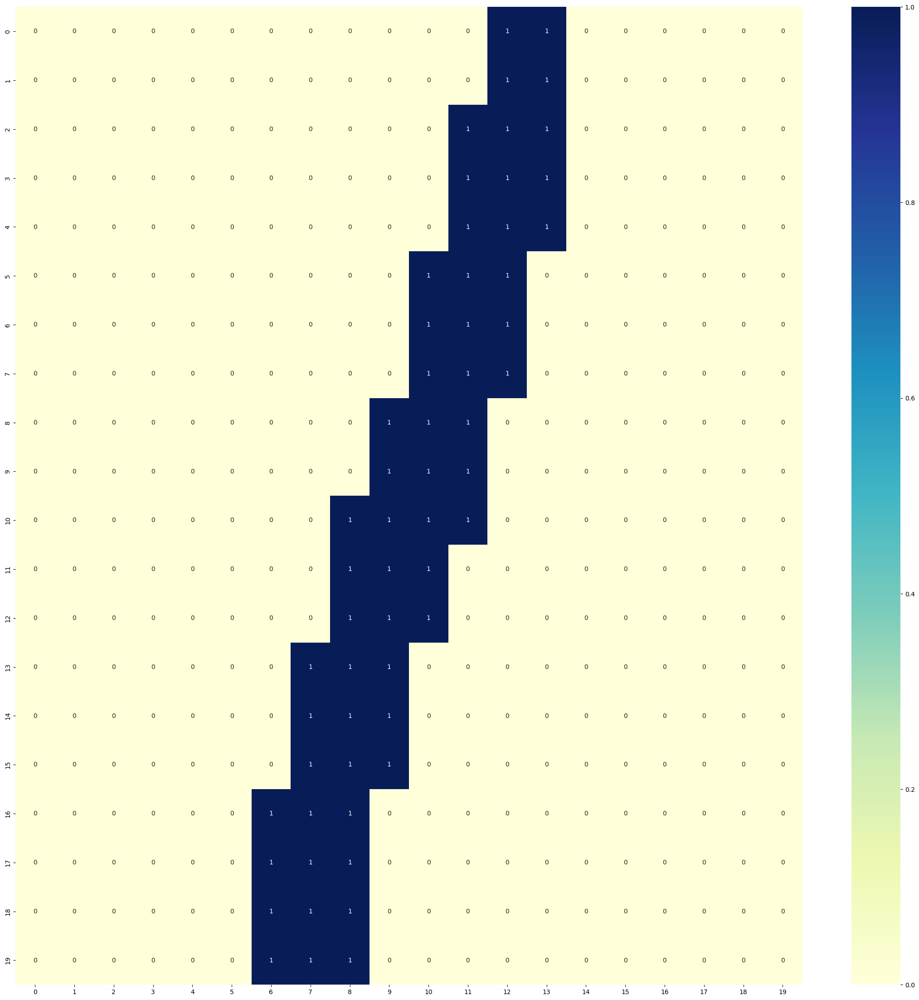

In [45]:
all_data = pd.read_csv('mnist_sample_selecaoFeature_binario.csv', sep=',')
# choose a number between 1 and 2050 to draw
to_show = 5

# define a matrix and rules
line_breaker = 0
square_reference = 20
matrix_row = 0
matrix = []
matrix.append([])

# pass through all_data
for index, row in all_data.iterrows():
    
    # the choosen one
    if index == to_show:
        
        # recover itens
        for item in row:
            
            # filter the y_class item
            if matrix_row < square_reference:
                
                # build matrix
                matrix[matrix_row].append(item)
                line_breaker += 1
                
                # new line
                if (line_breaker%square_reference == 0):
                    matrix_row += 1
                    
                    # append new line except for the last one
                    if matrix_row < square_reference:
                        matrix.append([])
                        
                    line_breaker = 0
        
        # No need to run iterrows until the end
        break

# heatmap plot of matrix
plt.figure(figsize=(28, 28))
sns.heatmap(matrix, annot=True, fmt="d", cmap="YlGnBu")
plt.show()


*Notas:*

Efeito combinado do filtro de atributos somado com o resultado da conversão para binário.

In [46]:
# python libraries
import optuna
import pandas as pd
import hiplot as hip 

# python codes
from resultado import Fold
from avaliacao import Experimento
from metodo import ScikitLearnAprendizadoDeMaquina

file_name = 'mnist_sample_selecaoFeature_binario.csv'

# define classes
numbers_names = ['0','1','2','3','4','5','6','7','8','9']
numbers_values = [x for x in range(10)]
numbers = dict(zip(numbers_values,numbers_names))

# recover DataFrame
df_data = pd.DataFrame(pd.read_csv(file_name))

#gera o fold e p experimento
folds = Fold.gerar_k_folds(df_data,val_k=5,col_classe='y_class',
                            num_repeticoes=1,seed=1,
                            num_folds_validacao=3,num_repeticoes_validacao=2)

In [47]:
# randomForrestClassifier
from sklearn.ensemble import RandomForestClassifier
from avaliacao import OtimizacaoObjetivoRandomForest

clf_rf = RandomForestClassifier(random_state=1)
ml_method = ScikitLearnAprendizadoDeMaquina(clf_rf)
exp = Experimento(folds,ml_method, OtimizacaoObjetivoRandomForest, num_trials=10,
                    sampler=optuna.samplers.TPESampler(seed=1, n_startup_trials=3))
exp.calcula_resultados()

[I 2023-10-19 16:49:26,770] A new study created in memory with name: no-name-cdc77020-ee96-44c3-99c7-3530816437c6
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75:

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
[I 2023-10-19 16:49:27,394] Trial 2 finished with value: 0.5138606696294277 and parameters: {'min_samples_split': 0.09313010568883545, 'max_features': 0.17278036352152387, 'num_arvores': 2}. Best is trial 2 with value: 0.5138606696294277.
C

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
[I 2023-10-19 16:49:28,797] Trial 6 finished with value: 0.7435447471977795 and parameters: {'min_samples_split': 0.014732611175317156, 'max_features': 0.2194546228877615, 'num_arvores': 4}. Best is trial 3 with value: 0.7775328261612938.
C

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.wa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.wa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.wa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
[I 2023-10-19 16:49:30,541] Trial 3 finished with value: 0.5954708367076572 and parameters: {'min_samples_split': 0.015334879477565427, 'max_features': 0.48889129347946686, 'num_arvores': 1}. Best is trial 3 with value: 0.5954708367076572.


C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
[I 2023-10-19 16:49:32,950] Trial 9 finished with value: 0.7324817950112771 and parameters: {'min_samples_split': 0.024279775412974488, 'max_features': 0.3171789482518962, 'num_arvores': 4}. Best is trial 6 with value: 0.7802754576585409.
[

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
[I 2023-10-19 16:49:34,111] Trial 3 finished with value: 0.7344621141971907 and parameters: {'min_samples_split': 0.021385632703359858, 'max_features': 0.04430884541496681, 'num_arvores': 5}. Best is trial 3 with value: 0.7344621141971907.


C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
[I 2023-10-19 16:49:34,982] Trial 6 finished with value: 0.3554580723021517 and parameters: {'min_samples_split': 0.19951599597999417, 'max_features': 0.017237486177267756, 'num_arvores': 3}. Best is trial 3 with value: 0.7344621141971907.
C:\Users\user\Documents\GitHub\machine-l

[I 2023-10-19 16:49:36,124] Trial 0 finished with value: 0.750411473504276 and parameters: {'min_samples_split': 0.01952739161644118, 'max_features': 0.08491520978228445, 'num_arvores': 5}. Best is trial 0 with value: 0.750411473504276.
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
[I 

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
[I 2023-10-19 16:49:36,890] Trial 3 finished with value: 0.753638230002199 and parameters: {'min_samples_split': 0.0034249534808694394, 'max_features': 0.03664504633566644, 'num_arvores': 5}. Best is trial 3 with value: 0.753638230002199.
C

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.wa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
[I 2023-10-19 16:49:37,852] Trial 7 finished with value: 0.7391781741905498 and parameters: {'min_samples_split': 0.00011906965528174886, 'max_features': 0.18095688893544903, 'num_arvores': 4}. Best is trial 3 with value: 0.753638230002199.

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:124: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:125: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  max_features = trial.suggest_uniform('max_features', 0, 0.5)
[I 2023-10-19 16:49:39,147] Trial 3 finished with value: 0.5156110887196843 and parameters: {'min_samples_split': 0.05087071984908803, 'max_features': 0.07876874906736847, 'num_arvores': 1}. Best is trial 3 with value: 0.5156110887196843.
C

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

In [48]:
studdy_fold_0 = exp.studies_per_fold[0]
studdy_fold_0.trials_dataframe().sort_values("value",ascending=False)

,number,value,datetime_start,datetime_complete,duration,params_max_features,params_min_samples_split,params_num_arvores,state
3,3,0.777533,2023-10-19 16:49:27.395250,2023-10-19 16:49:27.862250,0 days 00:00:00.467000,0.163638,0.006228,5,COMPLETE
6,6,0.743545,2023-10-19 16:49:28.366249,2023-10-19 16:49:28.797808,0 days 00:00:00.431559,0.219455,0.014733,4,COMPLETE
4,4,0.679633,2023-10-19 16:49:27.864253,2023-10-19 16:49:28.076250,0 days 00:00:00.211997,0.008135,0.019708,5,COMPLETE
2,2,0.513861,2023-10-19 16:49:27.209247,2023-10-19 16:49:27.393248,0 days 00:00:00.184001,0.172780,0.093130,2,COMPLETE
9,9,0.300667,2023-10-19 16:49:29.282811,2023-10-19 16:49:29.502808,0 days 00:00:00.219997,0.163679,0.235499,3,COMPLETE
5,5,0.280705,2023-10-19 16:49:28.078254,2023-10-19 16:49:28.361273,0 days 00:00:00.283019,0.496695,0.388678,5,COMPLETE
1,1,0.250844,2023-10-19 16:49:27.010249,2023-10-19 16:49:27.207253,0 days 00:00:00.197004,0.073378,0.151166,1,COMPLETE
7,7,0.209918,2023-10-19 16:49:28.798813,2023-10-19 16:49:28.978808,0 days 00:00:00.179995,0.111096,0.315703,3,COMPLETE
0,0,0.181320,2023-10-19 16:49:26.771258,2023-10-19 16:49:27.009251,0 days 00:00:00.237993,0.360162,0.208511,1,COMPLETE
8,8,0.167070,2023-10-19 16:49:28.980812,2023-10-19 16:49:29.281814,0 days 00:00:00.301002,0.302326,0.481135,4,COMPLETE


In [49]:
#gera grafico da variacao de parametros (apenas fold 0)
trials_fold_0 = exp.studies_per_fold[0].trials
data = [{**trial.params, 'loss': trial.value} for trial in trials_fold_0]
hip.Experiment.from_iterable(data).display(force_full_width=True)

<IPython.core.display.Javascript object>

In [50]:
print("Random Forest 20x20 Binary Form")
for resultado in exp.resultados:
    print("Macro f1: " + str(resultado.macro_f1))
    print("\nAcuracia: " + str(resultado.acuracia))
    print("\nf1 por classe: ")
    for key in resultado.f1_por_classe.keys():
        print('\t{} -> {}'.format(numbers[key], resultado.f1_por_classe[key]))
    print("\nprecisao: ")
    for key in resultado.precisao.keys():
        print('\t{} -> {}'.format(numbers[key], resultado.precisao[key]))
    print("\nrevocacao: ")
    for key in resultado.revocacao.keys():
        print('\t{} -> {}'.format(numbers[key], resultado.revocacao[key]))
    print('\nMatriz de confusao: ')
    print("\t", end='')
    for names in numbers.values():
        print(names[:2]+"\t", end='')
    print()
    for i in resultado.mat_confusao:
        print(numbers[i][0:2]+"\t", end='')
        for j in resultado.mat_confusao[i]:
            print(str(resultado.mat_confusao[i][j])+"\t", end='')
        print()
    print('\n')
    print('===================================================================\n')

Random Forest 20x20 Binary Form
Macro f1: 0.7688633082058539

Acuracia: 0.7701711491442543

f1 por classe: 
	0 -> 0.9473684210526315
	1 -> 0.8764044943820225
	2 -> 0.7307692307692308
	3 -> 0.6363636363636364
	4 -> 0.7164179104477613
	5 -> 0.6666666666666667
	6 -> 0.8500000000000001
	7 -> 0.8222222222222222
	8 -> 0.6829268292682927
	9 -> 0.7594936708860759

precisao: 
	0 -> 0.9473684210526315
	1 -> 0.8125
	2 -> 0.7755102040816326
	3 -> 0.56
	4 -> 0.7058823529411765
	5 -> 0.65625
	6 -> 0.8947368421052632
	7 -> 0.8604651162790697
	8 -> 0.717948717948718
	9 -> 0.7894736842105263

revocacao: 
	0 -> 0.9473684210526315
	1 -> 0.9512195121951219
	2 -> 0.6909090909090909
	3 -> 0.7368421052631579
	4 -> 0.7272727272727273
	5 -> 0.6774193548387096
	6 -> 0.8095238095238095
	7 -> 0.7872340425531915
	8 -> 0.6511627906976745
	9 -> 0.7317073170731707

Matriz de confusao: 
	0	1	2	3	4	5	6	7	8	9	
0	36	0	0	0	0	2	0	0	0	0	
1	0	39	0	1	0	0	0	0	1	0	
2	1	2	38	2	1	2	2	3	3	1	
3	0	1	2	28	0	3	1	0	3	0	
4	0	0	2	3	24	0	

In [51]:
# decisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier
from avaliacao import OtimizacaoObjetivoArvoreDecisao

clf_dtree = DecisionTreeClassifier(random_state=1)
ml_method = ScikitLearnAprendizadoDeMaquina(clf_dtree)
exp = Experimento(folds,ml_method, OtimizacaoObjetivoArvoreDecisao, num_trials=10,
                    sampler=optuna.samplers.TPESampler(seed=1, n_startup_trials=3))
exp.calcula_resultados()

[I 2023-10-19 16:49:40,872] A new study created in memory with name: no-name-0a9af241-6513-49c7-adb5-67e4bfe5a00f
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há element

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 6 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 7 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
[I 2023-10-19 16:49:44,286] Trial 0 finished with value: 0.4775742007896851 and parameters: {'min_samples_split': 0.15116628631591988}. Best is trial 0 with value: 0.4775742007896851.
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
[I 2023-10-19 16:49:44,649] Trial 1 finished with value: 0.590938644614653

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
[I 2023-10-19 16:49:46,281] Trial 6 finished with value: 0.6572235121622718 and parameters: {'min_samples_split': 0.009681653276866844}. Best is trial 6 with value: 0.6572235121622718.
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-alg

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há element

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
[I 2023-10-19 16:49:47,330] Trial 9 finished with value: 0.6620423981135986 and parameters: {'min_samples_split': 0.0059038968379269505}. Best is trial 9 with value: 0.6620423981135986.
[I 2023-10-19 16:49:47,433] A new study created in memory with name: no-name-cdefe731-837d-42de-a9d2-4556a453f29f
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  m

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 6 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

[I 2023-10-19 16:49:50,672] A new study created in memory with name: no-name-7e3cf564-e535-44db-8dc0-51723128d3d6
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWa

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há element

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 0 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 1 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
[I 2023-10-19 16:49:51,567] Trial 3 finished with value: 0.6479552590284746 and parameters: {'min_samples_split': 0.0305035875143973}. Best is trial 3 with value: 0.6479552590284746.
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
[I 2023-10-19 16:49:51,934] Trial 4 finished with val

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há element

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
[I 2023-10-19 16:49:54,197] Trial 2 finished with value: 0.6235984686450854 and parameters: {'min_samples_split': 0.013693796598963082}. Best is trial 2 with value: 0.6235984686450854.
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
[I 2023-10-19 16:49:54,604] Trial 3 finished with v

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
[I 2023-10-19 16:49:55,175] Trial 5 finished with value: 0.6383665693611532 and parameters: {'min_samples_split': 0.005516917673828947}. Best is trial 3 with value: 0.6501207106788665.
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-alg

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\avaliacao.py:106: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  min_samples = trial.suggest_uniform('min_samples_split', 0, 0.5)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 5 precisão foi definida como zero.
  warnings.warn("Não há element

C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 2 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 3 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a classe "+str(classe)+" precisão foi definida como zero.", UndefinedMetricWarning)
C:\Users\user\Documents\GitHub\machine-learning-algorithms\ap-de-maquina-cefetmg-optical-caracter-recognition\resultado.py:75: UndefinedMetricWarning: Não há elementos previstos para a classe 4 precisão foi definida como zero.
  warnings.warn("Não há elementos previstos para a cl

In [52]:
studdy_fold_0 = exp.studies_per_fold[0]
studdy_fold_0.trials_dataframe().sort_values("value",ascending=False)

,number,value,datetime_start,datetime_complete,duration,params_min_samples_split,state
3,3,0.679523,2023-10-19 16:49:41.814845,2023-10-19 16:49:42.253850,0 days 00:00:00.439005,0.005470,COMPLETE
2,2,0.676839,2023-10-19 16:49:41.357848,2023-10-19 16:49:41.813843,0 days 00:00:00.455995,0.000057,COMPLETE
4,4,0.623503,2023-10-19 16:49:42.254852,2023-10-19 16:49:42.580846,0 days 00:00:00.325994,0.041738,COMPLETE
7,7,0.562722,2023-10-19 16:49:43.059846,2023-10-19 16:49:43.461847,0 days 00:00:00.402001,0.101616,COMPLETE
8,8,0.539883,2023-10-19 16:49:43.463843,2023-10-19 16:49:43.731843,0 days 00:00:00.268000,0.124465,COMPLETE
6,6,0.462972,2023-10-19 16:49:42.749846,2023-10-19 16:49:43.058842,0 days 00:00:00.308996,0.167931,COMPLETE
0,0,0.348749,2023-10-19 16:49:40.873846,2023-10-19 16:49:41.170845,0 days 00:00:00.296999,0.208511,COMPLETE
9,9,0.288281,2023-10-19 16:49:43.732847,2023-10-19 16:49:43.940848,0 days 00:00:00.208001,0.266733,COMPLETE
1,1,0.195961,2023-10-19 16:49:41.171847,2023-10-19 16:49:41.355846,0 days 00:00:00.183999,0.360162,COMPLETE
5,5,0.109903,2023-10-19 16:49:42.582849,2023-10-19 16:49:42.747846,0 days 00:00:00.164997,0.483598,COMPLETE


In [53]:
#gera grafico da variacao de parametros (apenas fold 0)
trials_fold_0 = exp.studies_per_fold[0].trials
data = [{**trial.params, 'loss': trial.value} for trial in trials_fold_0]
hip.Experiment.from_iterable(data).display(force_full_width=True)

<IPython.core.display.Javascript object>

In [54]:
print("Decision Tree 20x20 Binary Form")
for resultado in exp.resultados:
    print("Macro f1: " + str(resultado.macro_f1))
    print("\nAcuracia: " + str(resultado.acuracia))
    print("\nf1 por classe: ")
    for key in resultado.f1_por_classe.keys():
        print('\t{} -> {}'.format(numbers[key], resultado.f1_por_classe[key]))
    print("\nprecisao: ")
    for key in resultado.precisao.keys():
        print('\t{} -> {}'.format(numbers[key], resultado.precisao[key]))
    print("\nrevocacao: ")
    for key in resultado.revocacao.keys():
        print('\t{} -> {}'.format(numbers[key], resultado.revocacao[key]))
    print('\nMatriz de confusao: ')
    print("\t", end='')
    for names in numbers.values():
        print(names[:2]+"\t", end='')
    print()
    for i in resultado.mat_confusao:
        print(numbers[i][0:2]+"\t", end='')
        for j in resultado.mat_confusao[i]:
            print(str(resultado.mat_confusao[i][j])+"\t", end='')
        print()
    print('\n')
    print('===================================================================\n')

Decision Tree 20x20 Binary Form
Macro f1: 0.7422191849532871

Acuracia: 0.7457212713936431

f1 por classe: 
	0 -> 0.8831168831168831
	1 -> 0.7450980392156863
	2 -> 0.7476635514018691
	3 -> 0.7123287671232877
	4 -> 0.7118644067796609
	5 -> 0.6769230769230768
	6 -> 0.8131868131868131
	7 -> 0.7640449438202246
	8 -> 0.7012987012987012
	9 -> 0.6666666666666667

precisao: 
	0 -> 0.8717948717948718
	1 -> 0.6229508196721312
	2 -> 0.7692307692307693
	3 -> 0.7428571428571429
	4 -> 0.8076923076923077
	5 -> 0.6470588235294118
	6 -> 0.7551020408163265
	7 -> 0.8095238095238095
	8 -> 0.7941176470588235
	9 -> 0.7027027027027027

revocacao: 
	0 -> 0.8947368421052632
	1 -> 0.926829268292683
	2 -> 0.7272727272727273
	3 -> 0.6842105263157895
	4 -> 0.6363636363636364
	5 -> 0.7096774193548387
	6 -> 0.8809523809523809
	7 -> 0.723404255319149
	8 -> 0.627906976744186
	9 -> 0.6341463414634146

Matriz de confusao: 
	0	1	2	3	4	5	6	7	8	9	
0	34	0	2	1	0	1	0	0	0	0	
1	1	38	0	1	0	0	1	0	0	0	
2	1	3	40	3	0	0	2	2	3	1	
3	1	

*Notas:*

Ao juntar as duas abordagens foi possível melhorar o desempenho do método Decision Tree de forma significativa. Por outro lado, o método Random Forest voltou para um intervalo próximo do original com leve melhoras segundo os indicadores. Isso mostra que os filtros e ajustes feitos na base de dados podem não contribuir ou até atrapalhar determinados métodos. Por outro lado podem provocar melhora expressiva em outros modelos.